# Water Observations from Space (WOfS) anomalies

* **Products used:** 
[wofs_ls](https://explorer.digitalearth.africa/wofs_ls)

## Description

The notebook loads the WOFLs Historic Flood Mapping Water Observations from Space to calculate water area anomalies for a selected Kenyan County.

Standardised anomaly is calculated as:

\begin{equation}
\text{Standardised anomaly }=\frac{x-m}{s}
\end{equation}

**x** is the seasonal mean, **m** is the long-term mean, and **s** is the long-term standard deviation.
 

The notebook outlines:

1. Loading a shapefile for Kenyan Counties and selecting a single county.
2. Loading  WOFLs data, generating the WOfS summaries and masking it to the selected county.
4. Calculating and plotting the seasonal WOfS anomalies and standardised anomalies.

***

# Getting started

To run this analysis, run all the cells in the notebook, starting with the "Load packages" cell. 

### Load packages

In [1]:
%matplotlib inline

import os
import datacube
import gc
import xarray as xr
import numpy as np
import pandas as pd
import geopandas as gpd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

from IPython.display import Image

from odc.algo import xr_reproject

from datacube.utils import masking, geometry
from datacube.utils.geometry import Geometry, CRS, assign_crs

from deafrica_tools.spatial import xr_rasterize
from deafrica_tools.dask import create_local_dask_cluster
from deafrica_tools.plotting import xr_animation
from deafrica_tools.datahandling import wofs_fuser

### Set up a Dask cluster

Dask can be used to better manage memory use and conduct the analysis in parallel. 
For an introduction to using Dask with Digital Earth Africa, see the [Dask notebook](../../Beginners_guide/08_Parallel_processing_with_dask.ipynb).

>**Note**: We recommend opening the Dask processing window to view the different computations that are being executed; to do this, see the *Dask dashboard in DE Africa* section of the [Dask notebook](../../Beginners_guide/08_Parallel_processing_with_dask.ipynb).

To use Dask, set up the local computing cluster using the cell below.

In [2]:
create_local_dask_cluster()

Client Scheduler: tcp://127.0.0.1:38449 Dashboard: /user/victoria@kartoza.com/proxy/8787/status,Cluster Workers: 1 Cores: 15 Memory: 104.37 GB


### Analysis parameters


The following cell sets important parameters for the analysis:

* `vector_file`: file path for the shapefile containing polygons for the boundaries of Kenyan counties
* `attribute_col`: The column in the "vector_file" containing the county names.
* `county`: In this analysis, we'll select a Kenyan County to mask the dataset and analysis.
* `time_m`: WOFLs data is available from 1984. The long-term mean for anomalies is often calculated on a 30-year period, so we'll use 1984 to 2014 in this example.
* `time_x`: This is the period for which we want to calculate anomalies.
* `resolution`: The spatial resolution, in metres, to resample the satellite data to. e.g. `(-30, 30)` will load data at its native 30 x 30m resolution. If loading a large area, then increase the resolution so the data will fit into memory.
* `output_crs` : The coordinate reference system that the loaded data is to be reprojected to.
* `dask_chunks`:  the size of the dask chunks, dask breaks data into manageable chunks that can be easily stored in memory, e.g. `dict(x=1000,y=1000)`
* `output_dir` :  The directory in which to store results from the analysis.
* `water_threshold` : Value by which to threshold WOfS summaries frequency band to classify water/not-water.


Anomaly is calculated as:

\begin{equation}
\text{anomaly}={x}-{m}
\end{equation}

where **x** is the seasonal mean, **m** is the long-term mean.


Standardised anomaly is calculated as:

\begin{equation}
\text{Standardised anomaly }=\frac{x-m}{s}
\end{equation}

$x$ is the seasonal mean, $m$ is the long-term mean, and $s$ is the long-term standard deviation.

This means we need a long-term reference period (m) and a period of interest (x) for which we'll calculate the anomalies. 

**If running the notebook for the first time**, keep the default settings below.
This will demonstrate how the analysis works and provide meaningful results.

In [3]:
vector_file = "data/Kenya_Counties.geojson"
attribute_col = "COUNTY_NAME"

# Select a county, for the example we will use Turkana County, a complete list of counties is available below.
county = "Turkana"

# Set the range of dates for the climatology, this will be the reference period (m) for the anomaly calculation.
# Standard practice is to use a 30 year period, so we've used 1984 to 2014 in this example.
time_m = ("1984", "2014")

# Time period to calculate the anomalies and standardised anomalies for (x).
time_x = ("2021", "2022")

# WOFLS native resolution is (-30,30).
resolution = (-120, 120)
output_crs = "EPSG:6933"

# Size of dask chunks.
dask_chunks = dict(x=1000, y=1000)

# Create the output directory to store the results.
output_dir = "results"
os.makedirs(output_dir, exist_ok=True)

water_threshold = 0.50

### Connect to the datacube

Connect to the datacube so we can access DE Africa data.
The `app` parameter is a unique name for the analysis which is based on the notebook file name.

In [4]:
dc = datacube.Datacube(app='wofs_anomaly')

### Load the Kenyan Counties shapefile

This shapefile contains polygons for the boundaries of Kenyan counties and will allows us to calculate rainfall anomalies within a chosen county.

In [5]:
kenyan_counties = gpd.read_file(vector_file)
kenyan_counties.explore()

### List counties

You can change the county in the analysis parameters cell to any Kenyan county. A complete list of counties is printed below.

In [6]:
print(np.unique(kenyan_counties[attribute_col]))

['Baringo' 'Bomet' 'Bungoma' 'Busia' 'Elgeyo-Marakwet' 'Embu' 'Garissa'
 'Homa Bay' 'Isiolo' 'Kajiado' 'Kakamega' 'Kericho' 'Kiambu' 'Kilifi'
 'Kirinyaga' 'Kisii' 'Kisumu' 'Kitui' 'Kwale' 'Laikipia' 'Lamu' 'Machakos'
 'Makueni' 'Mandera' 'Marsabit' 'Meru' 'Migori' 'Mombasa' "Murang'a"
 'Nairobi' 'Nakuru' 'Nandi' 'Narok' 'Nyamira' 'Nyandarua' 'Nyeri'
 'Samburu' 'Siaya' 'Taita Taveta' 'Tana River' 'Tharaka-Nithi'
 'Trans Nzoia' 'Turkana' 'Uasin Gishu' 'Vihiga' 'Wajir' 'West Pokot']


### Setup polygon

The county selected needs to be transformed into a geometry object to be used in the `dc.load()` function.

In [7]:
idx = kenyan_counties[kenyan_counties[attribute_col] == county].index[0]
geom = Geometry(geom=kenyan_counties.iloc[idx].geometry, crs=kenyan_counties.crs)

## Load WOFLS data

[Water Observations from Space (WOfS)](https://docs.digitalearthafrica.org/en/latest/data_specs/Landsat_WOfS_specs.html) is a service that draws on satellite imagery to provide historical surface water observations of the whole African continent. 
WOfS allows users to understand the location and movement of inland and coastal water present in the African landscape. 
It shows where water is usually present; where it is seldom observed; and where inundation of the surface has been observed by satellite.
They are generated using the WOfS classification algorithm on Landsat satellite data. 

Individual water-classified images are called **WOFLs (WOfS Feature Layers)**, and are created from the input Landsat satellite data. There is one WOFL (water and non-water classification) generated per Landsat scene that has been processed for the occurrence of water. For more information on WOFLs, see the [Applying WOfS bitmasking](../../Frequently_used_code/Applying_WOfS_bitmasking.ipynb) notebook.


As WOFLs are created scene-by-scene, and some scenes overlap, it's important when loading data to `group_by` solar day, and ensure that the data between scenes is combined correctly by using the WOfS `fuse_func`.
This will merge observations taken on the same day, and ensure that important data isn't lost when overlapping datasets are combined.

In [8]:
## Load WOFLS data for the 30-year reference period (m).
# Define the odc query.
query = {
    "geopolygon": geom,
    "time": time_m,
    "output_crs": output_crs,
    "resolution": resolution,
    "dask_chunks": dask_chunks,
}

# Load the WOFLs data from the datacube for the 30 year reference period (m).
ds_wofls_m = dc.load(
    product="wofs_ls",
    group_by="solar_day",
    fuse_func=wofs_fuser,
    collection_category="T1",  # only grab good georeferenced scenes
    **query
)

In [9]:
# Load WOFLs data for the period over which we want to calculate the anomalies and standardised anomalies (x).
# matching the spatial extent of the long term climatology WOFLS dataset.
ds_wofls_x = dc.load(
    product="wofs_ls",
    group_by="solar_day",
    fuse_func=wofs_fuser,
    collection_category="T1",  # only grab good georeferenced scenes
    like=ds_wofls_m.geobox,
    time=time_x,
    dask_chunks=dask_chunks,
)

## Masking using WOFLS bit flags

WOFLs uses [bit flags](https://datacube-core.readthedocs.io/en/latest/api/indexed-data/masking.html?highlight=masking#bit-masking) to flag pixels as "wet" or otherwise. For more details on bitmasking with WOfS, see the [Applying WOfS bitmasking](../../Frequently_used_code/Applying_WOfS_bitmasking.ipynb) notebook.

We can convert the WOfS bit field into a binary array containing True and False values. This allows us to use the WOFL data as a mask that can be applied to other datasets.

The `make_mask` function allows us to create a mask using the flag labels (e.g. "wet" or "dry") rather than the binary numbers in the mask. For example, we can easily identify pixels that were wet in each time step in the WOFLs dataset by passing the flag `wet=True`:

In [10]:
# Identify pixels that are clear and wet using the 'wet' flag.
ds_wofls_m_clear_wet = masking.make_mask(ds_wofls_m.water, wet=True)
ds_wofls_x_clear_wet = masking.make_mask(ds_wofls_x.water, wet=True)

# Identify pixels that are clearn and dry using the 'dry flaf'
ds_wofls_m_clear_dry = masking.make_mask(ds_wofls_m.water, dry=True)
ds_wofls_x_clear_dry = masking.make_mask(ds_wofls_x.water, dry=True)

## Get the WOfS summary

Determining the frequency a pixel was classified as wet within a time period requires: 

    - Total number of clear observations (no cloud or shadow) for each pixel for the selected time period. 
    - Total number of clear and wet observations for each pixel for the selected time period.

$$ \text{WOfS Summary (frequency)} = \frac{\text{Number of Clear and Wet Observations}}{\text{Number of Clear Observations}} $$


In this notebook, we will obtain the frequency a pixel was classified as wet each season.

>**Note:** A single season is 3 months (a quarter) in the year and the first season of the year begins in January. 

In [11]:
# Get the number of clear and wet observations in each season.
ds_wofls_m_clear_wet_observations = ds_wofls_m_clear_wet.resample(time="QS-JAN").sum()
ds_wofls_x_clear_wet_observations = ds_wofls_x_clear_wet.resample(time="QS-JAN").sum()

# Get the number of clear and dry obsercations in each season.
ds_wofls_m_clear_dry_observations = ds_wofls_m_clear_dry.resample(time="QS-JAN").sum()
ds_wofls_x_clear_dry_observations = ds_wofls_x_clear_dry.resample(time="QS-JAN").sum()

# Get the number of clear observations in each season.
ds_wofls_m_clear_observations = (
    ds_wofls_m_clear_wet_observations + ds_wofls_m_clear_dry_observations
)
ds_wofls_x_clear_observations = (
    ds_wofls_x_clear_wet_observations + ds_wofls_x_clear_dry_observations
)

# Get the frequency a pixel was classified a wet in each season.
frequency_m = ds_wofls_m_clear_wet_observations / ds_wofls_m_clear_observations
frequency_x = ds_wofls_x_clear_wet_observations / ds_wofls_x_clear_observations

# Compute.
frequency_m = frequency_m.compute()
frequency_x = frequency_x.compute()

In [12]:
# Convert the 'frequency' DataArrays to Datasets.
ds_wofs_m = frequency_m.to_dataset(name="frequency")
ds_wofs_x = frequency_x.to_dataset(name="frequency")

## Mask the WOfS summary datasets using the county boundary

Below, the county polygon is rasterized so the WOfS summary datasets are masked within that raster.

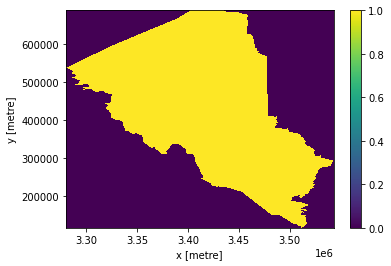

In [13]:
kenyan_counties = kenyan_counties.to_crs(output_crs)

mask = xr_rasterize(
    kenyan_counties[kenyan_counties[attribute_col] == county], ds_wofs_m
)

# Mask the WOfS frequency datasets.
ds_wofs_m = ds_wofs_m.where(mask)
ds_wofs_x = ds_wofs_x.where(mask)

# Plot the mask.
mask.plot();

## Threshold WOfS datasets to classify water/not-water


If the frequency (`ds_wofs.frequency`) that a pixel was classified as wet each season is greater than or equal to the `water_threshold` value, then the pixel is considered (classified) as regular open water during the season. 

In [14]:
# Threshold.
ds_water_extent_m = ds_wofs_m.frequency >= water_threshold
ds_water_extent_x = ds_wofs_x.frequency >= water_threshold

## Calculate the water area

The number of pixels can be used to calculate the area of the waterbody if the pixel area is known. Run the following cell to generate the necessary constants for performing this conversion.

In [15]:
# Calculate area of pixels.
pixel_length = query["resolution"][1]  # in metres
m_per_km = 1000  # conversion from metres to kilometres
area_per_pixel = pixel_length ** 2 / m_per_km ** 2

In [16]:
# For each season get the water area.
ds_water_area_m = ds_water_extent_m.sum(dim=["x", "y"]) * area_per_pixel
ds_water_area_x = ds_water_extent_x.sum(dim=["x", "y"]) * area_per_pixel

In [17]:
# Convert the 'ds_water_area_x' xarray.Dataset to a pandas DataFrame and drop the 'spatial_ref' column.
water_area_df = ds_water_area_x.to_dataframe().drop(["spatial_ref"], axis=1)

# Rename the 'frequency' column.
water_area_df.rename(columns={"frequency": "Water Area Extent (km$^2$)"}, inplace=True)

# Rename the index column
water_area_df.index.names = ["Season Start Date"]

water_area_df

,Water Area Extent (km$^2$)
Season Start Date,
2021-01-01,2423.2032
2021-04-01,2448.9504
2021-07-01,2458.5120
2021-10-01,2501.5392
2022-01-01,2521.2384
2022-04-01,2552.7456


## Get the long term mean and standard deviation of water area in the county

For each of the four seasons (quarters) in a year get the mean water area (km2) and the standard deviation in water area, averaged over the 30 year reference period (m). 

Firstly, the dataset is grouped by quarter. 
For each time step in the quarter group, the temporal mean (mean across the "time" dimension) is calculated.
The standard deviation in for each season/quarter is calculated in the same manner.

In [18]:
# Function to get the seasonal means for the county.
def temporal_mean(x):
    return x.mean("time")


# Function to get the seasonal standard deviations for the county.
def temporal_std(x):
    return x.std("time")


# For each of the 4 seasons in a year get the average water area (km2), averaged over the 30 year reference period.
climatology_mean = ds_water_area_m.groupby("time.quarter").map(temporal_mean)

# For each of the 4 seasons in a year get the standard deviation of water area (km2), averaged over the 30 year reference period.
climatology_std = ds_water_area_m.groupby("time.quarter").map(temporal_std)

## Get the water area anomalies and standardised anomalies for the county

In [19]:
# Function to get the seasonal anomalies.
def get_anomaly(ds):
    seasonal_mean = ds.groupby("time.quarter").map(temporal_mean)
    anomaly = seasonal_mean - climatology_mean
    return anomaly


# Function to get the seasonal standardised anomalies.
def get_standardised_anomaly(ds):
    seasonal_mean = ds.groupby("time.quarter").map(temporal_mean)
    standardised_anomaly = (seasonal_mean - climatology_mean) / climatology_std
    return standardised_anomaly


# Seasonal anomalies for the county.
anomalies = ds_water_area_x.groupby("time.year").map(get_anomaly).compute()

# Seasonal standardised anomalies for the county.
standardised_anomalies = (
    ds_water_area_x.groupby("time.year").map(get_standardised_anomaly).compute()
)

In [20]:
# Convert the 'anomalies' xarray.Dataset to a pandas DataFrame and drop the 'spatial_ref' column.
anomalies_df = anomalies.to_dataframe().drop(["spatial_ref"], axis=1).reset_index()

# Drop rows with N/A values in the 'frequency' column.
anomalies_df = anomalies_df.dropna(subset=["frequency"])


# Sort the DataFrame by year and quarter.
anomalies_df = anomalies_df.sort_values(["year", "quarter"], ascending=[True, True])

# Add the 'time' dimension from the WOfS summaries dataset for the anomaly period 'ds_wofs_x'.
anomalies_df.index = ds_wofs_x.time.values

# Drop the 'quarter' and 'year' columns.
anomalies_df = anomalies_df.drop(["quarter", "year"], axis=1)

# Rename the 'frequency' column.
anomalies_df.rename(
    columns={"frequency": "Water Area Anomalies (km$^2$)"}, inplace=True
)

# Rename the index column
anomalies_df.index.names = ["Season Start Date"]

anomalies_df

,Water Area Anomalies (km$^2$)
Season Start Date,
2021-01-01,181.128960
2021-04-01,279.445006
2021-07-01,266.928155
2021-10-01,276.673239
2022-01-01,279.164160
2022-04-01,383.240206


In [21]:
# Convert the 'standardised_anomalies' xarray.Dataset to a pandas DataFrame and drop the 'spatial_ref' column.
standardised_anomalies_df = (
    standardised_anomalies.to_dataframe().drop(["spatial_ref"], axis=1).reset_index()
)

# Drop rows with N/A values in the 'frequency' column.
standardised_anomalies_df = standardised_anomalies_df.dropna(subset=["frequency"])


# Sort the DataFrame by year and quarter.
standardised_anomalies_df = standardised_anomalies_df.sort_values(
    ["year", "quarter"], ascending=[True, True]
)

# Add the 'time' dimension from the WOfS summaries dataset for the anomaly period 'ds_wofs_x'.
standardised_anomalies_df.index = ds_wofs_x.time.values

# Drop the 'quarter' and 'year' columns.
standardised_anomalies_df = standardised_anomalies_df.drop(["quarter", "year"], axis=1)

# Rename the 'frequency' column.
standardised_anomalies_df.rename(
    columns={"frequency": "Water Area Standardised Anomalies (km$^2$)"}, inplace=True
)

# Rename the index column
standardised_anomalies_df.index.names = ["Season Start Date"]

standardised_anomalies_df

,Water Area Standardised Anomalies (km$^2$)
Season Start Date,
2021-01-01,0.979612
2021-04-01,0.527267
2021-07-01,0.584773
2021-10-01,0.627690
2022-01-01,1.509822
2022-04-01,0.723112


In [22]:
# Concatenate the 'water_area_df', 'anomalies_df' and  'standardised_anomalies' DataFrame.
wofs_anomalies = water_area_df.merge(anomalies_df, left_index=True, right_index=True).merge(standardised_anomalies_df,left_index=True, right_index=True)

wofs_anomalies

,Water Area Extent (km$^2$),Water Area Anomalies (km$^2$),Water Area Standardised Anomalies (km$^2$)
Season Start Date,,,
2021-01-01,2423.2032,181.128960,0.979612
2021-04-01,2448.9504,279.445006,0.527267
2021-07-01,2458.5120,266.928155,0.584773
2021-10-01,2501.5392,276.673239,0.627690
2022-01-01,2521.2384,279.164160,1.509822
2022-04-01,2552.7456,383.240206,0.723112


## Plot the water area over time, anomalies and standardised anomalies

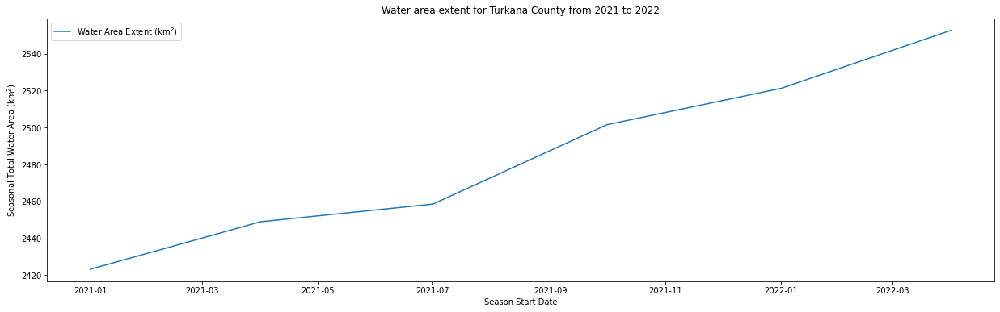

In [23]:
# Plot the area of water over time for the anomaly time period (x).
fig, ax = plt.subplots(figsize=(21, 6))
ax.plot(
    wofs_anomalies.index,
    wofs_anomalies["Water Area Extent (km$^2$)"],
    label="Water Area Extent (km$^2$)",
)
ax.set_ylabel("Seasonal Total Water Area (km$^2$)")
ax.set_xlabel("Season Start Date")
plt.title(f"Water area extent for {county} County from {time_x[0]} to {time_x[1]}")
plt.legend();
plt.savefig(f"results/seasonal_water_area_{county}_{time_x[0]}_to_{time_x[1]}.png")

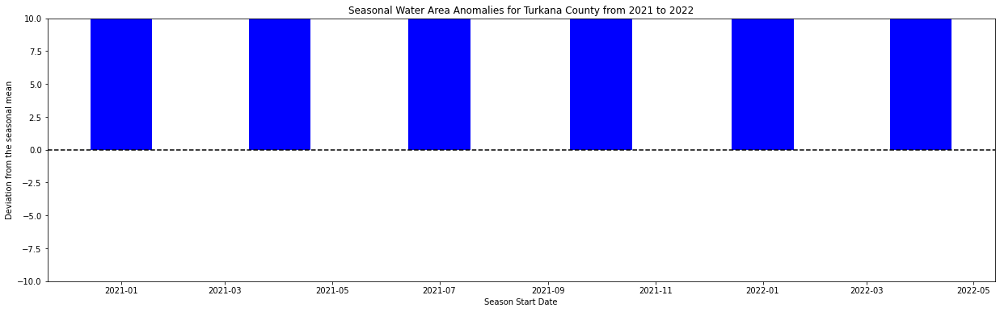

In [24]:
fig, ax = plt.subplots(figsize=(21, 6))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))
ax.set_ylim(-10, 10)
ax.bar(
    wofs_anomalies.index,
    wofs_anomalies["Water Area Anomalies (km$^2$)"],
    width=35,
    align="center",
    color=(wofs_anomalies["Water Area Anomalies (km$^2$)"] > 0).map(
        {True: "b", False: "r"}
    ),
)

ax.axhline(0, color="black", linestyle="--")
ax.set_ylabel("Deviation from the seasonal mean")
ax.set_xlabel("Season Start Date")
plt.title(
    f"Seasonal Water Area Anomalies for {county} County from {time_x[0]} to {time_x[1]}"
)
plt.savefig(f"results/seasonal_water_area_anomalies_{county}_{time_x[0]}_to_{time_x[1]}.png")

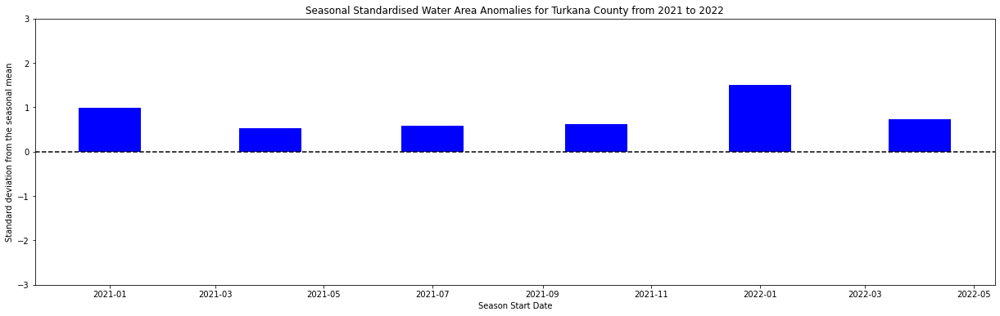

In [25]:
fig, ax = plt.subplots(figsize=(21, 6))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))
ax.set_ylim(-3, 3)
ax.bar(
    wofs_anomalies.index,
    wofs_anomalies["Water Area Standardised Anomalies (km$^2$)"],
    width=35,
    align="center",
    color=(wofs_anomalies["Water Area Standardised Anomalies (km$^2$)"] > 0).map(
        {True: "b", False: "r"}
    ),
)

ax.axhline(0, color="black", linestyle="--")
ax.set_ylabel("Standard deviation from the seasonal mean")
ax.set_xlabel("Season Start Date")
plt.title(
    f"Seasonal Standardised Water Area Anomalies for {county} County from {time_x[0]} to {time_x[1]}"
)
plt.savefig(f"results/seasonal_standardised_water_area_standardised_anomalies_{county}_{time_x[0]}_to_{time_x[1]}.png")

## Save results as CSV file

In [26]:
wofs_anomalies.to_csv(f"results/wofs_anomalies_{county}_{time_x[0]}_to_{time_x[1]}.csv")

---

## Additional information

**License:** The code in this notebook is licensed under the [Apache License, Version 2.0](https://www.apache.org/licenses/LICENSE-2.0). 
Digital Earth Africa data is licensed under the [Creative Commons by Attribution 4.0](https://creativecommons.org/licenses/by/4.0/) license.

**Contact:** If you need assistance, please post a question on the [Open Data Cube Slack channel](http://slack.opendatacube.org/) or on the [GIS Stack Exchange](https://gis.stackexchange.com/questions/ask?tags=open-data-cube) using the `open-data-cube` tag (you can view previously asked questions [here](https://gis.stackexchange.com/questions/tagged/open-data-cube)).

**Compatible datacube version:**

In [27]:
print(datacube.__version__)

1.8.6


**Last Tested:**

In [28]:
from datetime import datetime
datetime.today().strftime('%Y-%m-%d')

'2022-05-17'